## Set up

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from collections import defaultdict
import warnings

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.cluster import DBSCAN
from strsimpy.jaro_winkler import JaroWinkler
from tqdm.notebook import tqdm

from sf_permits.config import (
    logger,
    RAW_DATASET_PATH,
    NEIGHBOURHOOD_SHAPEFILE_PATH,
    ZIP_CODE_SHAPEFILE_PATH,
    STREET_NAMES_PATH,
)

sns.set_theme()

2024-12-18 07:18:28.951 | INFO     | sf_permits.config:<module>:11 - PROJ_ROOT path is: /home/tomaz/git/Politecnico/Subjects/data-information-quality/sf-permits


In [4]:
EXPECTED_MISSING_VARIABLES = [
    "Unit",
    "Street Number Suffix",
    "Unit Suffix",
]

In [5]:
df = pd.read_csv(RAW_DATASET_PATH)
df

/tmp/ipykernel_2949/2713445764.py:1: DtypeWarning: Columns (22,32) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(RAW_DATASET_PATH)


,Permit Number,Permit Type,Permit Type Definition,Permit Creation Date,Block,Lot,Street Number,Street Number Suffix,Street Name,Street Suffix,...,Existing Construction Type,Existing Construction Type Description,Proposed Construction Type,Proposed Construction Type Description,Site Permit,Supervisor District,Neighborhoods - Analysis Boundaries,Zipcode,Location,Record ID
0,201505065519,4,sign - erect,05/06/2015,0326,023,140,NaN,Ellis,St,...,3.0,constr type 3,NaN,NaN,NaN,3.0,Tenderloin,94102.0,"(37.785719256680785, -122.40852313194863)",1380611233945
1,201604195146,4,sign - erect,04/19/2016,0306,007,440,NaN,Geary,St,...,3.0,constr type 3,NaN,NaN,NaN,3.0,Tenderloin,94102.0,"(37.78733980600732, -122.41063199757738)",1420164406718
2,201605278609,3,additions alterations or repairs,05/27/2016,0595,203,1647,NaN,Pacific,Av,...,1.0,constr type 1,1.0,constr type 1,NaN,3.0,Russian Hill,94109.0,"(37.7946573324287, -122.42232562979227)",1424856504716
3,201611072166,8,otc alterations permit,11/07/2016,0156,011,1230,NaN,Pacific,Av,...,5.0,wood frame (5),5.0,wood frame (5),NaN,3.0,Nob Hill,94109.0,"(37.79595867909168, -122.41557405519474)",1443574295566
4,201611283529,6,demolitions,11/28/2016,0342,001,950,NaN,Market,St,...,3.0,constr type 3,NaN,NaN,NaN,6.0,Tenderloin,94102.0,"(37.78315261897309, -122.40950883997789)",144548169992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198895,M862628,8,otc alterations permit,12/05/2017,0113,017A,1228,NaN,Montgomery,St,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1489337276729
198896,201712055595,8,otc alterations permit,12/05/2017,0271,014,580,NaN,Bush,St,...,5.0,wood frame (5),5.0,wood frame (5),NaN,NaN,NaN,NaN,NaN,1489462354993
198897,M863507,8,otc alterations permit,12/06/2017,4318,019,1568,NaN,Indiana,St,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1489539379952
198898,M863747,8,otc alterations permit,12/06/2017,0298,029,795,NaN,Sutter,St,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1489608233656


Location-related columns

In [6]:
coordinates = (
    df["Location"]
    .str.replace("(", "")
    .str.replace(")", "")
    .str.split(",", expand=True)
    .astype("float")
)
df["latitude"] = coordinates[0]
df["longitude"] = coordinates[1]

print(df[~df["Location"].isna()][["latitude", "longitude"]].isna().any())
print(df[df["Location"].isna()][["latitude", "longitude"]].isna().all())

latitude     False
longitude    False
dtype: bool
latitude     True
longitude    True
dtype: bool


In [7]:
LOCATION_COLUMNS = [
    "Block",
    "Lot",
    "Street Number",
    "Street Number Suffix",
    "Street Name",
    "Street Suffix",
    "Unit",
    "Unit Suffix",
    "Supervisor District",
    "Neighborhoods - Analysis Boundaries",
    "Zipcode",
    "latitude",
    "longitude",
]

In [8]:
location_df = df[LOCATION_COLUMNS].convert_dtypes()
location_df

,Block,Lot,Street Number,Street Number Suffix,Street Name,Street Suffix,Unit,Unit Suffix,Supervisor District,Neighborhoods - Analysis Boundaries,Zipcode,latitude,longitude
0,0326,023,140,<NA>,Ellis,St,<NA>,<NA>,3,Tenderloin,94102,37.785719,-122.408523
1,0306,007,440,<NA>,Geary,St,0,<NA>,3,Tenderloin,94102,37.78734,-122.410632
2,0595,203,1647,<NA>,Pacific,Av,<NA>,<NA>,3,Russian Hill,94109,37.794657,-122.422326
3,0156,011,1230,<NA>,Pacific,Av,0,<NA>,3,Nob Hill,94109,37.795959,-122.415574
4,0342,001,950,<NA>,Market,St,<NA>,<NA>,6,Tenderloin,94102,37.783153,-122.409509
...,...,...,...,...,...,...,...,...,...,...,...,...,...
198895,0113,017A,1228,<NA>,Montgomery,St,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198896,0271,014,580,<NA>,Bush,St,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198897,4318,019,1568,<NA>,Indiana,St,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198898,0298,029,795,<NA>,Sutter,St,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


In [9]:
location_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198900 entries, 0 to 198899
Data columns (total 13 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Block                                198900 non-null  string 
 1   Lot                                  198900 non-null  string 
 2   Street Number                        198900 non-null  Int64  
 3   Street Number Suffix                 2216 non-null    string 
 4   Street Name                          198900 non-null  string 
 5   Street Suffix                        196132 non-null  string 
 6   Unit                                 29479 non-null   Int64  
 7   Unit Suffix                          1961 non-null    string 
 8   Supervisor District                  197183 non-null  Int64  
 9   Neighborhoods - Analysis Boundaries  197175 non-null  string 
 10  Zipcode                              197184 non-null  Int64  
 11  latitude     

In [10]:
no_coordinate_df = location_df[
    location_df[["latitude", "longitude"]].isna().any(axis="columns")
]
no_coordinate_df.shape

(1700, 13)

## Analyse

### Permits with coordinates

<Axes: xlabel='latitude', ylabel='longitude'>

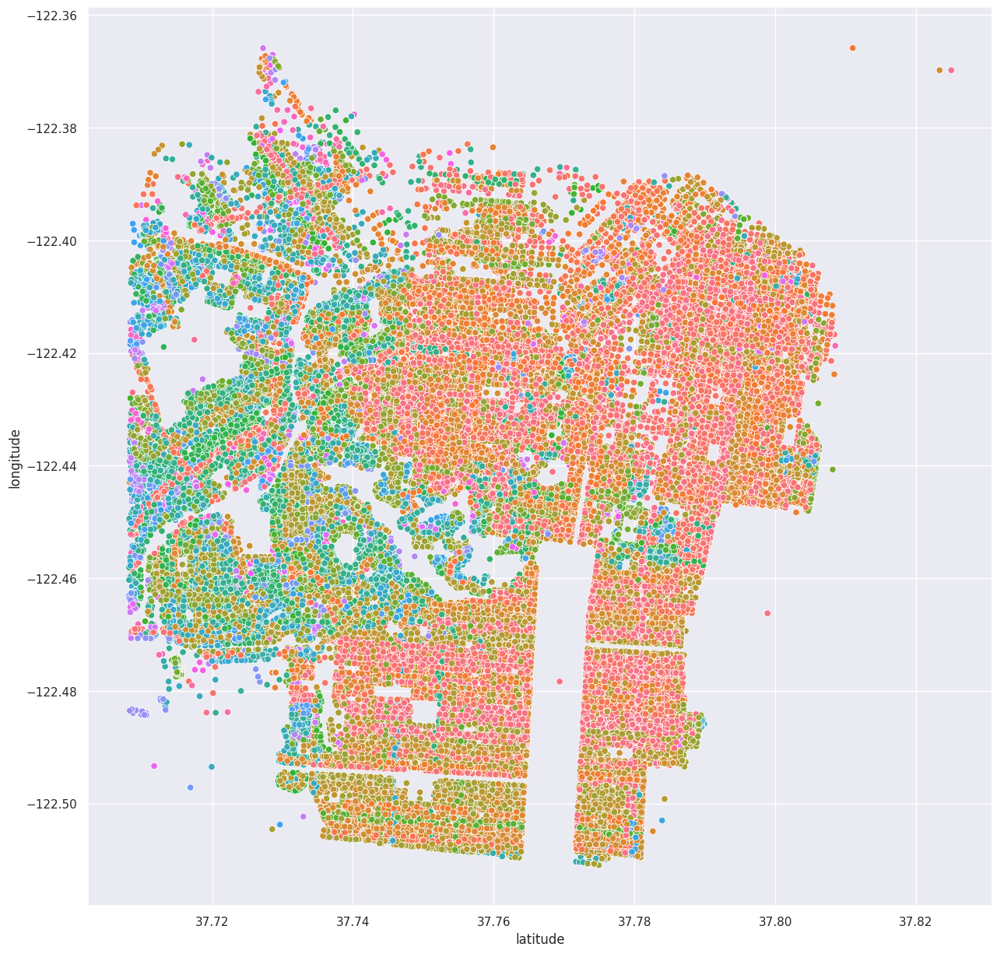

In [9]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(
    location_df,
    x="latitude",
    y="longitude",
    hue="Street Name",
    legend=False,
    ax=ax,
)

<Axes: xlabel='latitude', ylabel='longitude'>

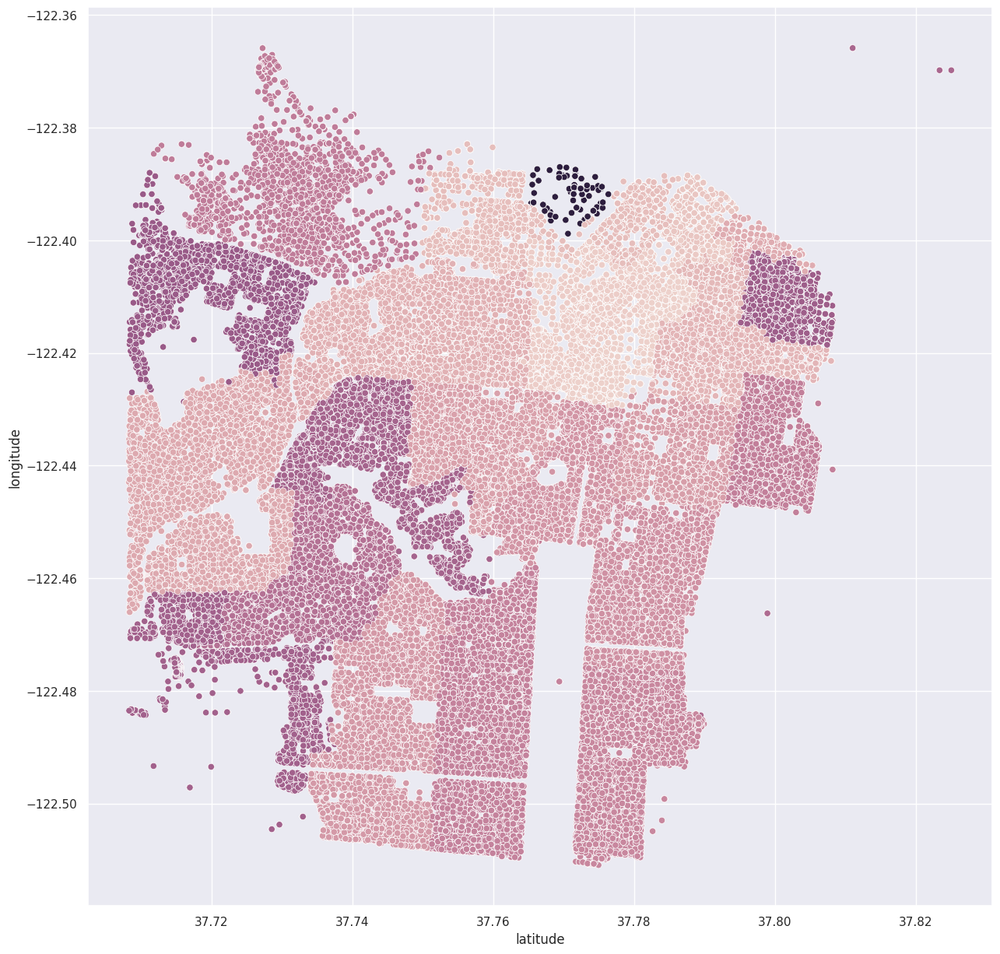

In [10]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(
    location_df,
    x="latitude",
    y="longitude",
    hue="Zipcode",
    legend=False,
    ax=ax,
)

<Axes: xlabel='latitude', ylabel='longitude'>

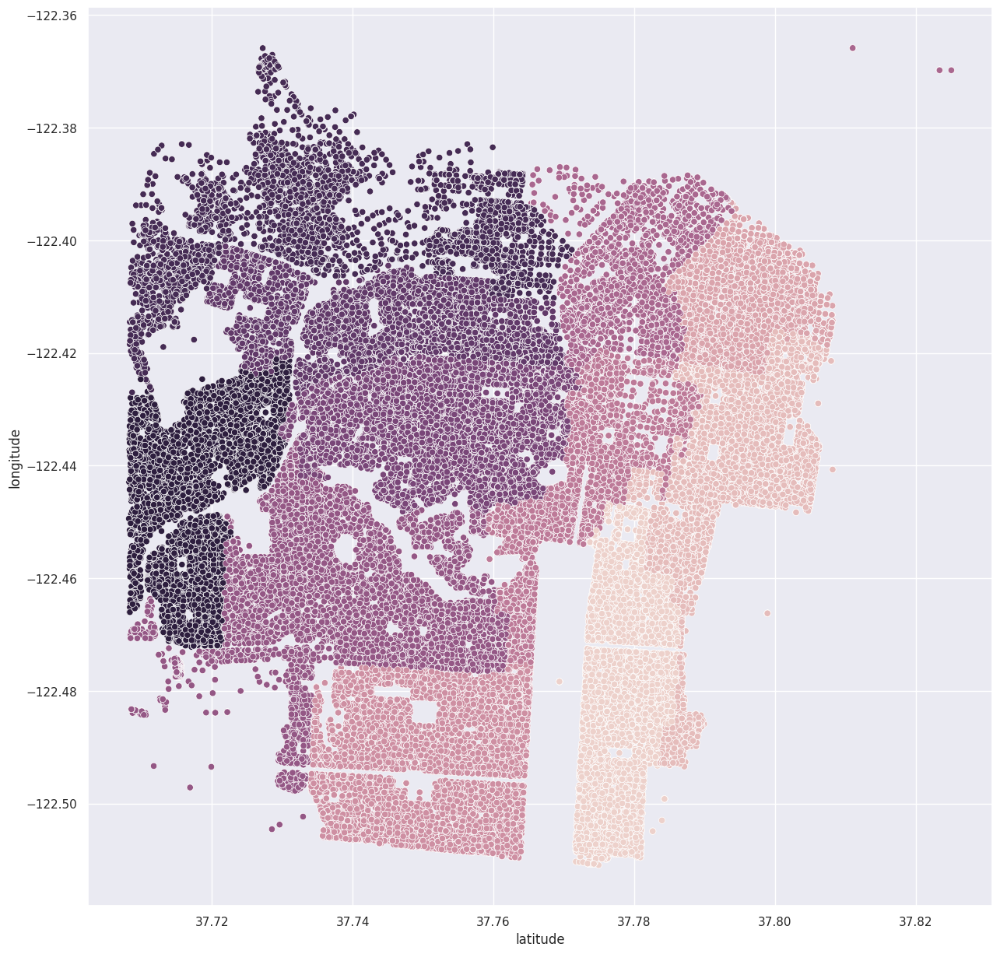

In [11]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(
    location_df,
    x="latitude",
    y="longitude",
    hue="Supervisor District",
    legend=False,
    ax=ax,
)

<Axes: xlabel='latitude', ylabel='longitude'>

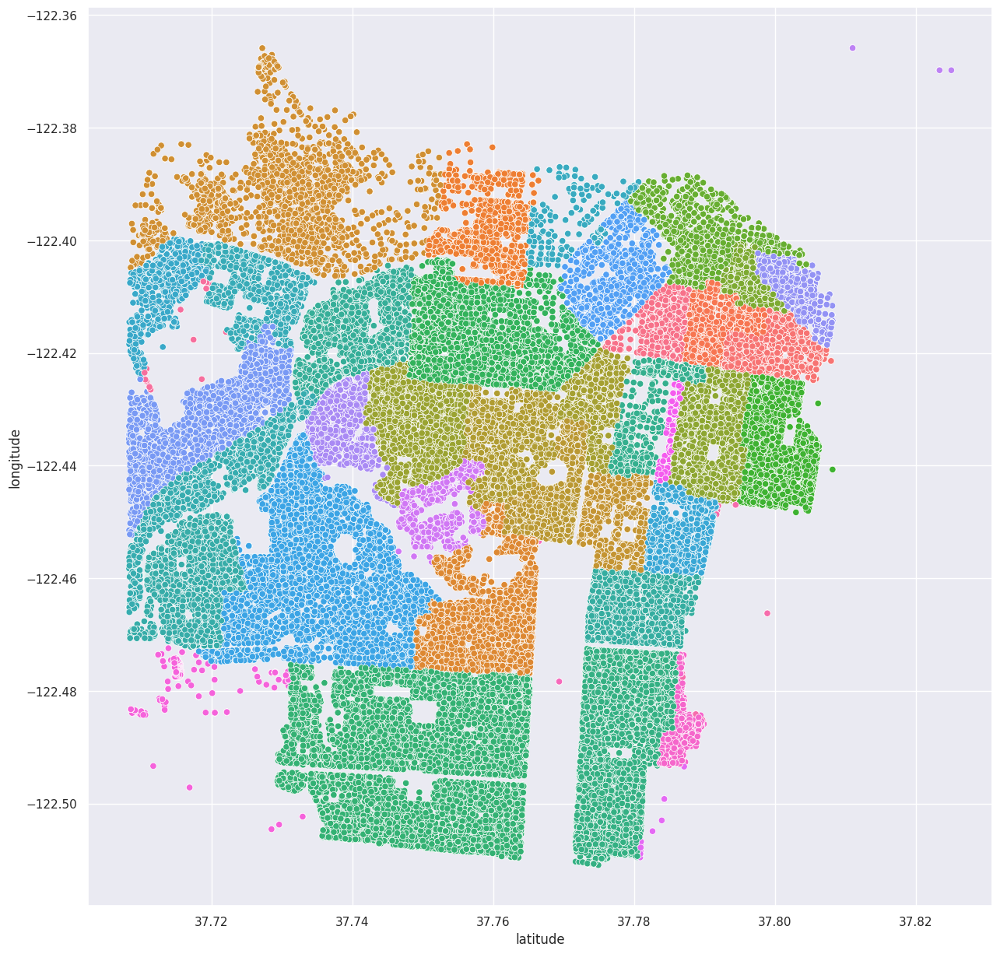

In [12]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(
    location_df,
    x="latitude",
    y="longitude",
    hue="Neighborhoods - Analysis Boundaries",
    legend=False,
    ax=ax,
)

#### Missing values

In [13]:
molten_location_df = location_df.dropna(subset=["latitude", "longitude"]).melt(
    id_vars=["latitude", "longitude"]
)
molten_location_df

,latitude,longitude,variable,value
0,37.785719,-122.408523,Block,0326
1,37.78734,-122.410632,Block,0306
2,37.794657,-122.422326,Block,0595
3,37.795959,-122.415574,Block,0156
4,37.783153,-122.409509,Block,0342
...,...,...,...,...
2169195,37.807471,-122.41024,Zipcode,94133
2169196,37.723207,-122.427637,Zipcode,94112
2169197,37.78697,-122.409367,Zipcode,94102
2169198,37.772171,-122.421936,Zipcode,94103


In [15]:
molten_location_df["missing_value"] = molten_location_df["value"].isna()
molten_location_df["missing_value"].mean()

np.float64(0.2585427807486631)

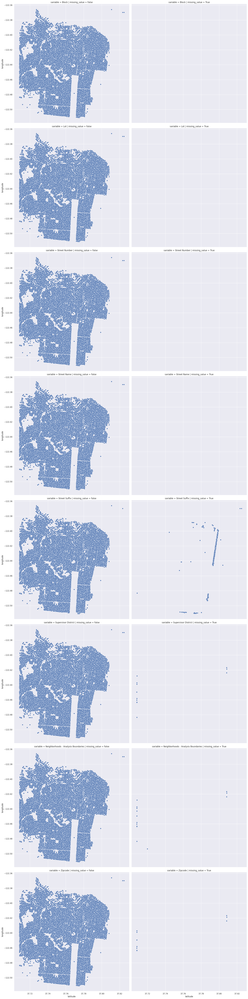

In [16]:
sns.relplot(
    molten_location_df[
        ~molten_location_df["variable"].isin(EXPECTED_MISSING_VARIABLES)
    ],
    x="latitude",
    y="longitude",
    row="variable",
    col="missing_value",
    kind="scatter",
    height=10,
)

<Axes: ylabel='Frequency'>

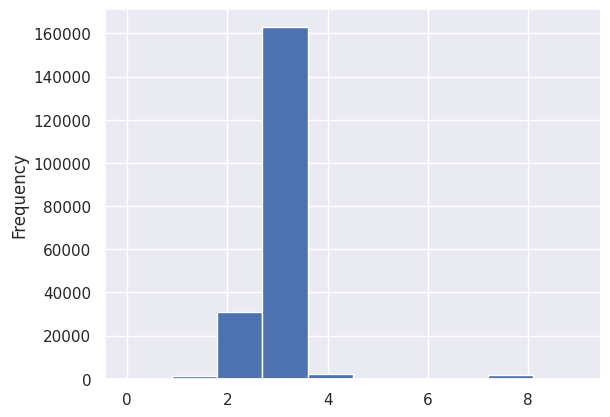

In [17]:
location_df.isna().sum(axis="columns").plot.hist()

<Axes: ylabel='Frequency'>

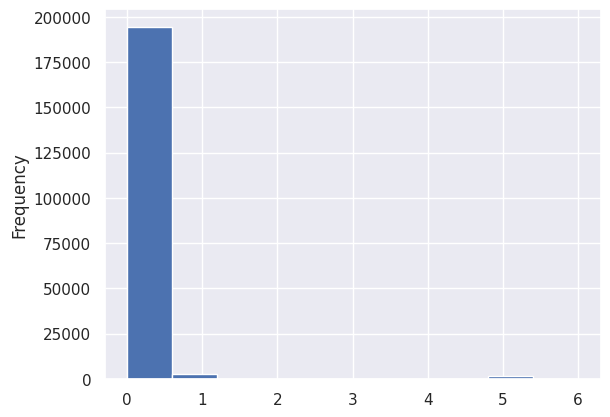

In [18]:
unexpected_na_count_series = (
    location_df.drop(columns=EXPECTED_MISSING_VARIABLES).isna().sum(axis="columns")
)
unexpected_na_count_series.plot.hist()

In [19]:
no_street_suffix_df = location_df[location_df["Street Suffix"].isna()]
no_street_suffix_df

,Block,Lot,Street Number,Street Number Suffix,Street Name,Street Suffix,Unit,Unit Suffix,Supervisor District,Neighborhoods - Analysis Boundaries,Zipcode,latitude,longitude
143,8721,032,455,<NA>,Mission Bay Blvd South,<NA>,0,<NA>,6,Mission Bay,94158,37.770452,-122.388529
197,3775,064,140,<NA>,South Park,<NA>,<NA>,<NA>,6,Financial District/South Beach,94107,37.781457,-122.394729
367,1939,001,1,<NA>,Avenue Of The Palms,<NA>,<NA>,BLDG 1,6,Treasure Island,94130,37.82335,-122.369791
391,0961,017,2661,<NA>,Broadway,<NA>,<NA>,<NA>,2,Pacific Heights,94115,37.793294,-122.44075
456,3775,005,2,<NA>,South Park,<NA>,<NA>,<NA>,6,Financial District/South Beach,94107,37.782424,-122.393236
...,...,...,...,...,...,...,...,...,...,...,...,...,...
198542,0231,023,2,<NA>,Embarcadero Center,<NA>,<NA>,<NA>,3,Financial District/South Beach,94111,37.794799,-122.398473
198546,0582,020,2315,<NA>,Broadway,<NA>,<NA>,<NA>,2,Pacific Heights,94115,37.793871,-122.43567
198721,0231,023,2,<NA>,Embarcadero Center,<NA>,<NA>,<NA>,3,Financial District/South Beach,94111,37.794799,-122.398473
198744,0232,016,3,<NA>,Embarcadero Center,<NA>,<NA>,<NA>,3,Financial District/South Beach,94111,37.794948,-122.397298


<Axes: xlabel='latitude', ylabel='longitude'>

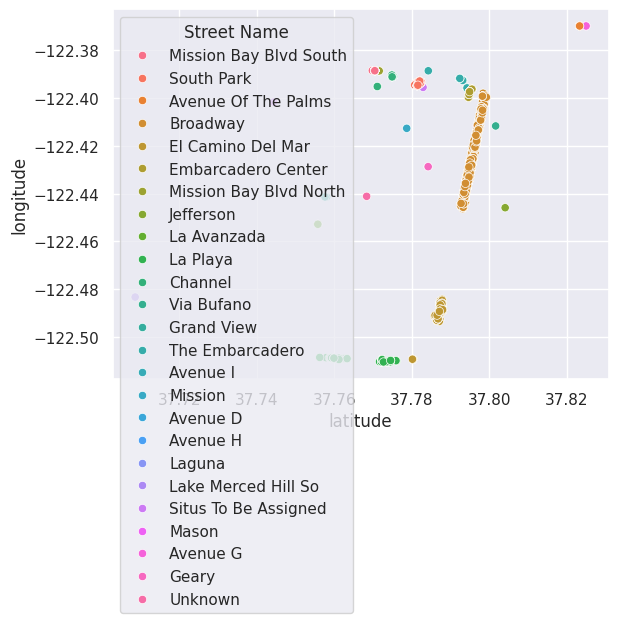

In [20]:
sns.scatterplot(
    no_street_suffix_df,
    x="latitude",
    y="longitude",
    hue="Street Name",
    legend=True,
)

### Permits without coordinates

<Axes: >

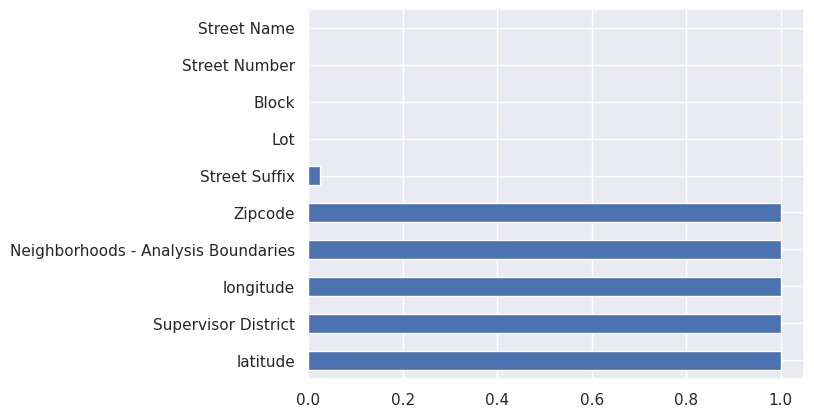

In [21]:
(
    no_coordinate_df.isna()
    .mean(axis="rows")
    .drop(EXPECTED_MISSING_VARIABLES)
    .sort_values(ascending=False)
    .plot.barh()
)

In [22]:
no_coordinate_df["Street Name"].value_counts()

Street Name
Mission       77
Berry         60
04th          55
California    54
02nd          49
              ..
Darrell        1
Mariposa       1
Arlington      1
Adair          1
Sharon         1
Name: count, Length: 259, dtype: Int64

In [23]:
df.loc[no_coordinate_df.index]["Permit Number"].value_counts().value_counts()

count
1    1560
2      67
3       2
Name: count, dtype: int64

## Normalisation

In [24]:
clean_location_df = location_df.copy().dropna(how="all")

In [25]:
for string_column in clean_location_df.select_dtypes("string"):
    clean_location_df[string_column] = clean_location_df[string_column].str.lower()
clean_location_df

,Block,Lot,Street Number,Street Number Suffix,Street Name,Street Suffix,Unit,Unit Suffix,Supervisor District,Neighborhoods - Analysis Boundaries,Zipcode,latitude,longitude
0,0326,023,140,<NA>,ellis,st,<NA>,<NA>,3,tenderloin,94102,37.785719,-122.408523
1,0306,007,440,<NA>,geary,st,0,<NA>,3,tenderloin,94102,37.78734,-122.410632
2,0595,203,1647,<NA>,pacific,av,<NA>,<NA>,3,russian hill,94109,37.794657,-122.422326
3,0156,011,1230,<NA>,pacific,av,0,<NA>,3,nob hill,94109,37.795959,-122.415574
4,0342,001,950,<NA>,market,st,<NA>,<NA>,6,tenderloin,94102,37.783153,-122.409509
...,...,...,...,...,...,...,...,...,...,...,...,...,...
198895,0113,017a,1228,<NA>,montgomery,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198896,0271,014,580,<NA>,bush,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198897,4318,019,1568,<NA>,indiana,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198898,0298,029,795,<NA>,sutter,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


In [26]:
clean_location_df = clean_location_df.rename(
    columns={"Neighborhoods - Analysis Boundaries": "Neighborhood"}
)
clean_location_df

,Block,Lot,Street Number,Street Number Suffix,Street Name,Street Suffix,Unit,Unit Suffix,Supervisor District,Neighborhood,Zipcode,latitude,longitude
0,0326,023,140,<NA>,ellis,st,<NA>,<NA>,3,tenderloin,94102,37.785719,-122.408523
1,0306,007,440,<NA>,geary,st,0,<NA>,3,tenderloin,94102,37.78734,-122.410632
2,0595,203,1647,<NA>,pacific,av,<NA>,<NA>,3,russian hill,94109,37.794657,-122.422326
3,0156,011,1230,<NA>,pacific,av,0,<NA>,3,nob hill,94109,37.795959,-122.415574
4,0342,001,950,<NA>,market,st,<NA>,<NA>,6,tenderloin,94102,37.783153,-122.409509
...,...,...,...,...,...,...,...,...,...,...,...,...,...
198895,0113,017a,1228,<NA>,montgomery,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198896,0271,014,580,<NA>,bush,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198897,4318,019,1568,<NA>,indiana,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198898,0298,029,795,<NA>,sutter,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


### Street suffix

In [27]:
STREET_SUFFIX_MAP = {
    "av": ["avenue", "ave"],
    "wy": ["via"],
    "bl": ["blvd"],
}

In [28]:
for index, street_name in tqdm(
    clean_location_df["Street Name"].items(), total=clean_location_df.shape[0]
):
    if not pd.isna(clean_location_df.loc[index, "Street Suffix"]):
        continue

    logger.debug("Index {} and street name '{}' has null suffix", index, street_name)
    for suffix, aliases in STREET_SUFFIX_MAP.items():
        for alias in aliases:
            if alias in street_name:
                logger.debug("Street name matches alias '{}'", alias)
                clean_location_df.loc[index, "Street Suffix"] = suffix
                clean_location_df.loc[index, "Street Name"] = street_name.replace(
                    alias, ""
                ).strip()
                break
clean_location_df

  0%|          | 0/198900 [00:00<?, ?it/s]

2024-12-17 20:42:58.917 | DEBUG    | __main__:<module>:7 - Index 143 and street name 'mission bay blvd south' has null suffix
2024-12-17 20:42:58.918 | DEBUG    | __main__:<module>:11 - Street name matches alias 'blvd'
2024-12-17 20:42:58.946 | DEBUG    | __main__:<module>:7 - Index 197 and street name 'south park' has null suffix
2024-12-17 20:42:58.948 | DEBUG    | __main__:<module>:7 - Index 367 and street name 'avenue of the palms' has null suffix
2024-12-17 20:42:58.948 | DEBUG    | __main__:<module>:11 - Street name matches alias 'avenue'
2024-12-17 20:42:58.976 | DEBUG    | __main__:<module>:7 - Index 391 and street name 'broadway' has null suffix
2024-12-17 20:42:58.977 | DEBUG    | __main__:<module>:7 - Index 456 and street name 'south park' has null suffix
2024-12-17 20:42:58.978 | DEBUG    | __main__:<module>:7 - Index 568 and street name 'broadway' has null suffix
2024-12-17 20:42:58.980 | DEBUG    | __main__:<module>:7 - Index 866 and street name 'broadway' has null suffix

,Block,Lot,Street Number,Street Number Suffix,Street Name,Street Suffix,Unit,Unit Suffix,Supervisor District,Neighborhood,Zipcode,latitude,longitude
0,0326,023,140,<NA>,ellis,st,<NA>,<NA>,3,tenderloin,94102,37.785719,-122.408523
1,0306,007,440,<NA>,geary,st,0,<NA>,3,tenderloin,94102,37.78734,-122.410632
2,0595,203,1647,<NA>,pacific,av,<NA>,<NA>,3,russian hill,94109,37.794657,-122.422326
3,0156,011,1230,<NA>,pacific,av,0,<NA>,3,nob hill,94109,37.795959,-122.415574
4,0342,001,950,<NA>,market,st,<NA>,<NA>,6,tenderloin,94102,37.783153,-122.409509
...,...,...,...,...,...,...,...,...,...,...,...,...,...
198895,0113,017a,1228,<NA>,montgomery,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198896,0271,014,580,<NA>,bush,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198897,4318,019,1568,<NA>,indiana,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
198898,0298,029,795,<NA>,sutter,st,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


In [29]:
clean_location_df["Street Suffix"].dropna().unique()

<StringArray>
['st', 'av', 'tr', 'ct', 'bl', 'wy', 'dr', 'rd', 'cr', 'pl', 'ln', 'hy', 'pk',
 'al', 'pz', 'wk', 'rw', 'so', 'sw', 'no', 'hl']
Length: 21, dtype: string

## Error correction

### Street name suffix

In [30]:
clean_location_df[clean_location_df["Street Name"] == "situs to be assigned"] = pd.NA

### Street name

(0.0, 100.0)

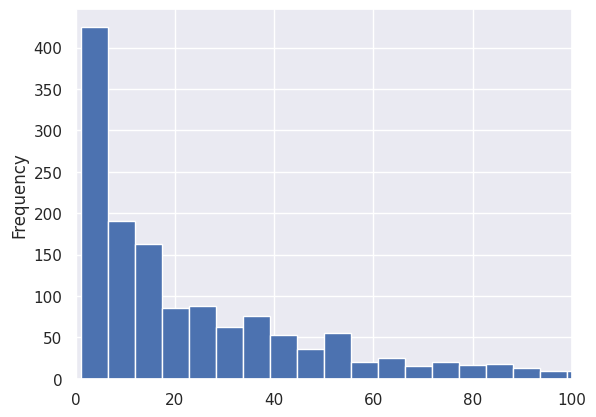

In [31]:
street_names = clean_location_df["Street Name"]
ax = street_names.value_counts().plot.hist(bins=1000)
ax.set_xlim(0, 100)

In [55]:
base_street_names = street_names[street_names.duplicated()].dropna().drop_duplicates()
base_street_names

3             pacific
11               fell
29             powell
30             taylor
49               15th
             ...     
193135    el plazuela
193328         pueblo
193875       overlook
197696          brush
197767        08th ti
Name: Street Name, Length: 1597, dtype: string

In [56]:
SIMILARITY_THRESHOLD = 0.97
BLOCK_LENGTH = 2

matching_indices: dict[int, list] = defaultdict(list)
matching_names: dict[str, list] = defaultdict(list)  # Only for visualisation

for base_index, base_name in tqdm(
    base_street_names.items(), total=len(base_street_names)
):
    logger.info("Processing street name {}", base_name)
    block_key = base_name[:BLOCK_LENGTH]
    block = street_names[street_names.str.startswith(block_key)]
    logger.debug("{} candidates in block '{}'", len(block), block_key)
    for i, name in block.items():
        if name == base_name:
            continue
        if JaroWinkler().similarity(base_name, name) > SIMILARITY_THRESHOLD:
            matching_indices[base_index].append(i)
            matching_names[base_name].append(name)
    number_matches = len(matching_indices[base_name])
    if number_matches == 0:
        logger.warning("No matches found for '{}'", base_name)
    else:
        logger.debug(
            "{} matches in for '{}'", len(matching_indices[base_name]), base_name
        )
matching_indices = {key: value for key, value in matching_indices.items() if value}
matching_names = {key: value for key, value in matching_names.items() if value}
len(matching_indices)

  0%|          | 0/1597 [00:00<?, ?it/s]

2024-12-17 21:01:46.683 | INFO     | __main__:<module>:10 - Processing street name pacific
2024-12-17 21:01:46.703 | DEBUG    | __main__:<module>:13 - 3877 candidates in block 'pa'
2024-12-17 21:01:46.714 | WARNING  | __main__:<module>:22 - No matches found for 'pacific'
2024-12-17 21:01:46.714 | INFO     | __main__:<module>:10 - Processing street name fell
2024-12-17 21:01:46.734 | DEBUG    | __main__:<module>:13 - 820 candidates in block 'fe'
2024-12-17 21:01:46.735 | WARNING  | __main__:<module>:22 - No matches found for 'fell'
2024-12-17 21:01:46.736 | INFO     | __main__:<module>:10 - Processing street name powell
2024-12-17 21:01:46.756 | DEBUG    | __main__:<module>:13 - 3727 candidates in block 'po'
2024-12-17 21:01:46.770 | WARNING  | __main__:<module>:22 - No matches found for 'powell'
2024-12-17 21:01:46.770 | INFO     | __main__:<module>:10 - Processing street name taylor
2024-12-17 21:01:46.788 | DEBUG    | __main__:<module>:13 - 1281 candidates in block 'ta'
2024-12-17 21

39

In [57]:
for base_name, matches in matching_names.items():
    print(base_name.rjust(20), "\t", len(matches))

           francisco 	 16
    buena vista west 	 115
            edinburg 	 2
  mission bay  north 	 104
              marina 	 78
               wilde 	 17
              wilder 	 35
  mission bay  south 	 3
mission bay blvd north 	 3
   terry a. francois 	 7
    buena vista east 	 64
     mountain spring 	 2
               marin 	 143
 lake merced hill no 	 25
 lake merced hill so 	 50
            bay view 	 5
       saint josephs 	 1
              oliver 	 3
               helen 	 3
lake merced hill st south 	 21
          richardson 	 1
              lundys 	 6
lake merced hill st north 	 37
              august 	 1
    lake merced hill 	 11
buena vista ave east 	 26
dr carlton b goodlett 	 4
buena vista ave west 	 15
             lundy's 	 44
    mountain springs 	 27
              helena 	 5
             bayview 	 9
            marsilly 	 2
               olive 	 10
           edinburgh 	 116
dr. carlton b. goodlett 	 4
             francis 	 572
             marsily 	 4
    terry

In [96]:
clean_location_df_backup = clean_location_df.copy()

In [114]:
clean_location_df = clean_location_df_backup.copy()

In [1]:
for base_index, target_indices in tqdm(matching_indices.items()):
    logger.info("Processing base {}", base_index)
    locations = clean_location_df.loc[target_indices + [base_index]][["latitude", "longitude"]]
    if locations.isna().any().any():
        logger.warning("NaN found in location, dropping")
        locations = locations.dropna()
    clustering = DBSCAN(eps=1e-3, min_samples=3)
    clusters = clustering.fit_predict(locations)
    logger.debug("Unique cluster labels: {}", np.unique(clusters))
    base_cluster = clusters[-1]
    if base_cluster == -1:
        logger.debug("Skipping outlying base")
        continue
    for target_index, target_cluster in zip(target_indices, clusters[:-1]):
        previous_name = clean_location_df.loc[target_index, "Street Name"]
        new_name = clean_location_df.loc[base_index, "Street Name"]
        if target_cluster != base_cluster:
            logger.debug("Skipping target street name '{}' and base '{}'", previous_name, new_name)
            continue
        logger.debug("Replacing target street name '{}' with base '{}'", previous_name, new_name)
        clean_location_df.loc[target_index, "Street Name"] = new_name

NameError: name 'tqdm' is not defined

In [ ]:
external_street_names_df = pd.read_csv(STREET_NAMES_PATH).convert_dtypes()
for string_column in external_street_names_df.select_dtypes("string"):
    external_street_names_df[string_column] = external_street_names_df[
        string_column
    ].str.lower()
external_street_names_df

,FullStreetName,StreetName,StreetType,PostDirection
0,01st st,01st,st,<NA>
1,02nd ave,02nd,ave,<NA>
2,02nd st,02nd,st,<NA>
3,02nd ti st,02nd ti,st,<NA>
4,03rd ave,03rd,ave,<NA>
...,...,...,...,...
2703,cravath st,cravath,st,<NA>
2704,sandpiper ln,sandpiper,ln,<NA>
2705,garden walk,garden,walk,<NA>
2706,la avanzada st,la avanzada,st,<NA>


### Using location

In [37]:
def match(base: gpd.GeoDataFrame, target: gpd.GeoSeries) -> pd.DataFrame:
    match_df = pd.DataFrame(index=target.index)
    for id_, geometry in tqdm(base.itertuples(index=False), total=base.shape[0]):
        match_df[id_] = target.within(geometry)
    return pd.from_dummies(match_df, default_category=pd.NA)

In [38]:
location_geometry = gpd.GeoSeries.from_xy(
    clean_location_df["longitude"], clean_location_df["latitude"]
)
location_geometry

0         POINT (-122.40852 37.78572)
1         POINT (-122.41063 37.78734)
2         POINT (-122.42233 37.79466)
3         POINT (-122.41557 37.79596)
4         POINT (-122.40951 37.78315)
                     ...             
198895                    POINT EMPTY
198896                    POINT EMPTY
198897                    POINT EMPTY
198898                    POINT EMPTY
198899                    POINT EMPTY
Length: 198900, dtype: geometry

#### Neighbourhood

In [39]:
neighbourhood_gdf: gpd.GeoDataFrame = gpd.read_file(NEIGHBOURHOOD_SHAPEFILE_PATH)
neighbourhood_gdf.head()

,nhood,geometry
0,Western Addition,"POLYGON ((-122.42144 37.78557, -122.42136 37.7..."
1,West of Twin Peaks,"POLYGON ((-122.46104 37.75096, -122.46055 37.7..."
2,Visitacion Valley,"POLYGON ((-122.40385 37.71883, -122.40355 37.7..."
3,Twin Peaks,"POLYGON ((-122.44695 37.75655, -122.44595 37.7..."
4,South of Market,"POLYGON ((-122.40371 37.78404, -122.40271 37.7..."


In [40]:
neighbourhood_match_df = match(neighbourhood_gdf, location_geometry)
neighbourhood_match_df

  0%|          | 0/41 [00:00<?, ?it/s]

,
0,Tenderloin
1,Tenderloin
2,Russian Hill
3,Nob Hill
4,Tenderloin
...,...
198895,<NA>
198896,<NA>
198897,<NA>
198898,<NA>


In [41]:
clean_location_df["Neighborhood"] = (
    neighbourhood_match_df.iloc[:, 0]
    .combine_first(clean_location_df["Neighborhood"])
    .str.lower()
)
clean_location_df["Neighborhood"]

0           tenderloin
1           tenderloin
2         russian hill
3             nob hill
4           tenderloin
              ...     
198895            <NA>
198896            <NA>
198897            <NA>
198898            <NA>
198899            <NA>
Name: Neighborhood, Length: 198900, dtype: object

#### ZIP code

In [42]:
zipcode_gdf: gpd.GeoDataFrame = gpd.read_file(ZIP_CODE_SHAPEFILE_PATH)
zipcode_gdf.head()

,po_name,zip,state,area,length,geometry
0,Los Banos,93635,CA,0.144947,2.906139,"POLYGON ((-121.24865 37.03368, -121.24739 37.0..."
1,Belmont,94002,CA,0.001518,0.255886,"POLYGON ((-122.33908 37.50711, -122.33898 37.5..."
2,Brisbane,94005,CA,0.001338,0.224634,"POLYGON ((-122.45605 37.69382, -122.45597 37.6..."
3,Burlingame,94010,CA,0.003408,0.474228,"POLYGON ((-122.41295 37.57835, -122.41294 37.5..."
4,Daly City,94014,CA,0.001567,0.275590,"POLYGON ((-122.47216 37.70311, -122.47216 37.7..."


In [43]:
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
    zipcode_match_df = match(zipcode_gdf[["zip", "geometry"]], location_geometry)
zipcode_match_df

  0%|          | 0/323 [00:00<?, ?it/s]

,
0,94102
1,94102
2,94109
3,94109
4,94102
...,...
198895,<NA>
198896,<NA>
198897,<NA>
198898,<NA>


In [44]:
clean_location_df["Zipcode"] = zipcode_match_df.iloc[:, 0].combine_first(
    clean_location_df["Zipcode"]
)
clean_location_df["Zipcode"]

0         94102
1         94102
2         94109
3         94109
4         94102
          ...  
198895     <NA>
198896     <NA>
198897     <NA>
198898     <NA>
198899     <NA>
Name: Zipcode, Length: 198900, dtype: object

## Missing value imputation

In [45]:
columns_to_impute = clean_location_df.columns.difference(EXPECTED_MISSING_VARIABLES)
columns_to_impute

Index(['Block', 'Lot', 'Neighborhood', 'Street Name', 'Street Number',
       'Street Suffix', 'Supervisor District', 'Zipcode', 'latitude',
       'longitude'],
      dtype='object')

In [46]:
def impute(
    df: pd.DataFrame, mean_columns: list[str] = [], mode_columns: list[str] = []
) -> pd.DataFrame:
    imputed_df = df.copy()
    for column in mean_columns:
        imputed_df.loc[:, column] = imputed_df[column].fillna(
            imputed_df[column].mean(skipna=True)
        )
    for column in mode_columns:
        imputed_df.loc[:, column] = imputed_df[column].fillna(
            imputed_df[column].mode(dropna=True)
        )
    return imputed_df

In [47]:
def missing_value_report(df: pd.DataFrame) -> None:
    print(df.isna().sum()[columns_to_impute])

In [48]:
def impute_group(
    df: pd.DataFrame,
    group: str | list[str],
    mean_columns: list[str] = [],
    mode_columns: list[str] = [],
) -> pd.DataFrame:
    if isinstance(group, list):
        na_mask = df[group].isna().any(axis="columns")
    else:
        na_mask = df[group].isna()
    group_df_list = [df[na_mask]]
    for _, group_df in tqdm(df.groupby(group)):
        group_df_list.append(impute(group_df, mean_columns, mode_columns))
    group_df = pd.concat(group_df_list)
    missing_value_report(group_df)
    return group_df

### Filling location using `Block` and `Lot`

In [49]:
missing_value_report(clean_location_df)

Block                     5
Lot                       5
Neighborhood           1726
Street Name               5
Street Number             5
Street Suffix          2704
Supervisor District    1722
Zipcode                1708
latitude               1705
longitude              1705
dtype: int64


In [50]:
clean_location_df = impute_group(
    clean_location_df,
    ["Block", "Lot"],
    mean_columns=("latitude", "longitude"),
    mode_columns=(
        "Street Name",
        "Street Suffix",
        "Supervisor District",
    ),
)

  0%|          | 0/64856 [00:00<?, ?it/s]

Block                     5
Lot                       5
Neighborhood           1726
Street Name               5
Street Number             5
Street Suffix          2704
Supervisor District    1722
Zipcode                1708
latitude               1705
longitude              1705
dtype: int64


### Filling location using `Street Name`

In [51]:
clean_location_df = impute_group(
    clean_location_df,
    "Street Name",
    mean_columns=("latitude", "longitude"),
    mode_columns=(
        "Street Suffix",
        "Supervisor District",
    ),
)

  0%|          | 0/1704 [00:00<?, ?it/s]

Block                     5
Lot                       5
Neighborhood           1726
Street Name               5
Street Number             5
Street Suffix          2704
Supervisor District    1722
Zipcode                1708
latitude                  9
longitude                 9
dtype: int64


### Filling `Neighborhood` and `Zipcode` using imputed location

After imputing the location, we are able to use it to correct and impute `Neighborhood` and `Zipcode` as we did before

In [52]:
location_geometry = gpd.GeoSeries.from_xy(
    clean_location_df["longitude"], clean_location_df["latitude"]
)

neighbourhood_match_df = match(neighbourhood_gdf, location_geometry)
clean_location_df["Neighborhood"] = (
    neighbourhood_match_df.iloc[:, 0]
    .combine_first(clean_location_df["Neighborhood"])
    .str.lower()
)

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
    zipcode_match_df = match(zipcode_gdf[["zip", "geometry"]], location_geometry)
zipcode_match_df
clean_location_df["Zipcode"] = zipcode_match_df.iloc[:, 0].combine_first(
    clean_location_df["Zipcode"]
)

missing_value_report(clean_location_df)

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/323 [00:00<?, ?it/s]

Block                     5
Lot                       5
Neighborhood             30
Street Name               5
Street Number             5
Street Suffix          2704
Supervisor District    1722
Zipcode                  12
latitude                  9
longitude                 9
dtype: int64


### Exploit approximate functional dependency between `Neighborhood` and `Supervisor District`

In [53]:
neighbourhood_district_records = (
    clean_location_df[["Neighborhood", "Supervisor District"]]
    .dropna()
    .drop_duplicates("Neighborhood")  # Keep only a single neighbourhood per district
    .to_dict("records")
)
neighbourhood_district_records

[{'Neighborhood': 'financial district/south beach', 'Supervisor District': 6},
 {'Neighborhood': 'inner richmond', 'Supervisor District': 2},
 {'Neighborhood': 'inner sunset', 'Supervisor District': 5},
 {'Neighborhood': 'mission bay', 'Supervisor District': 6},
 {'Neighborhood': 'south of market', 'Supervisor District': 6},
 {'Neighborhood': 'potrero hill', 'Supervisor District': 6},
 {'Neighborhood': 'bayview hunters point', 'Supervisor District': 10},
 {'Neighborhood': 'treasure island', 'Supervisor District': 6},
 {'Neighborhood': 'west of twin peaks', 'Supervisor District': 7},
 {'Neighborhood': 'golden gate park', 'Supervisor District': 1},
 {'Neighborhood': 'mission', 'Supervisor District': 6},
 {'Neighborhood': 'seacliff', 'Supervisor District': 2},
 {'Neighborhood': 'outer richmond', 'Supervisor District': 1},
 {'Neighborhood': 'castro/upper market', 'Supervisor District': 8},
 {'Neighborhood': 'haight ashbury', 'Supervisor District': 5},
 {'Neighborhood': 'presidio', 'Supervi

In [54]:
neighbourhood_district_map = {
    record["Neighborhood"]: record["Supervisor District"]
    for record in neighbourhood_district_records
}
neighbourhood_district_map

{'financial district/south beach': 6,
 'inner richmond': 2,
 'inner sunset': 5,
 'mission bay': 6,
 'south of market': 6,
 'potrero hill': 6,
 'bayview hunters point': 10,
 'treasure island': 6,
 'west of twin peaks': 7,
 'golden gate park': 1,
 'mission': 6,
 'seacliff': 2,
 'outer richmond': 1,
 'castro/upper market': 8,
 'haight ashbury': 5,
 'presidio': 2,
 'sunset/parkside': 4,
 'twin peaks': 8,
 'oceanview/merced/ingleside': 11,
 'lakeshore': 7,
 'noe valley': 8,
 'bernal heights': 9,
 'glen park': 8,
 'lincoln park': 1,
 'excelsior': 11,
 'chinatown': 3,
 'outer mission': 11,
 'russian hill': 3,
 'visitacion valley': 10,
 'marina': 2,
 'tenderloin': 6,
 'lone mountain/usf': 1,
 'north beach': 3,
 'portola': 9,
 'presidio heights': 2,
 'nob hill': 3,
 'western addition': 2,
 'pacific heights': 2,
 'japantown': 5,
 'hayes valley': 5,
 'mclaren park': 10}

In [55]:
for neighbourhood, district in neighbourhood_district_map.items():
    clean_location_df.loc[clean_location_df["Neighborhood"] == neighbourhood, "Supervisor District"] = district
    clean_location_df.loc[clean_location_df["Supervisor District"] == district, "Neighborhood"] = neighbourhood
missing_value_report(clean_location_df)

Block                     5
Lot                       5
Neighborhood             26
Street Name               5
Street Number             5
Street Suffix          2704
Supervisor District      26
Zipcode                  12
latitude                  9
longitude                 9
dtype: int64
